In [1]:
%matplotlib inline
import os
import sys
sys.path.append('/root/capsule/aind-beh-ephys-analysis/code/beh_ephys_analysis')
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
import json
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import re
from beh_functions import session_dirs
from plot_untils import shiftedColorMap, template_reorder, plot_raster_bar,merge_pdfs
from open_ephys.analysis import Session
import spikeinterface as si
import spikeinterface.extractors as se
import spikeinterface.postprocessing as spost
import spikeinterface.widgets as sw
from aind_ephys_utils import align
from matplotlib.colors import LinearSegmentedColormap
from matplotlib import colormaps

from aind_dynamic_foraging_basic_analysis.licks.lick_analysis import load_nwb
from aind_dynamic_foraging_data_utils.nwb_utils import load_nwb_from_filename

 
# Create a white-to-bright red colormap
colors = [(1, 1, 1), (1, 0, 0)]  # white to red
my_red = LinearSegmentedColormap.from_list("white_to_red", colors)

In [2]:
session_df = pd.read_csv('/root/capsule/aind-beh-ephys-analysis/code/data_management/session_assets.csv')
session_ids = session_df['session_id'].unique()
session_ids

array(['behavior_716325_2024-05-29_10-33-32',
       'behavior_716325_2024-05-30_11-33-46',
       'behavior_716325_2024-05-31_10-31-14',
       'behavior_716325_2024-06-01_09-25-37',
       'behavior_717121_2024-06-11_10-23-31',
       'behavior_717121_2024-06-13_12-21-20',
       'behavior_717121_2024-06-14_10-23-49',
       'behavior_717121_2024-06-15_10-00-58',
       'behavior_717121_2024-06-16_11-45-02',
       'behavior_717259_2024-06-25_10-09-25',
       'behavior_717259_2024-06-26_10-23-07',
       'behavior_717259_2024-06-28_11-17-19',
       'behavior_717263_2024-07-23_11-46-42',
       'behavior_717263_2024-07-24_10-40-05',
       'behavior_717263_2024-07-25_10-02-21',
       'behavior_714116_2024-08-27_11-29-48',
       'behavior_714116_2024-08-28_12-11-55',
       'behavior_714116_2024-08-29_11-46-43',
       'behavior_722832_2024-09-13_11-55-58',
       'behavior_724172_2024-10-01_11-20-11',
       'behavior_724172_2024-10-03_11-02-53',
       'behavior_739970_2024-10-15

In [11]:
session_id = session_ids[-3] 
session_dir = session_dirs(session_id)
session_id

'behavior_751004_2024-12-22_13-09-17'

In [69]:
opto_df = pd.read_csv(os.path.join(session_dir['opto_tag_dir'], session_id + '_opto_session.csv'))

In [70]:
sorting = si.load_extractor(session_dir['curated_dir'])
unit_ids = sorting.get_unit_ids()

In [71]:
# load quality metrics from nwb
# load quality metrics
if os.path.exists(session_dir['nwb_dir']):
    nwb = load_nwb(session_dir['nwb_dir'])
    unit_qc = nwb.units[:][['ks_unit_id', 'isi_violations_ratio', 'firing_rate', 'presence_ratio', 'amplitude_cutoff', 'decoder_label']]
else:
    print('No nwb file found.')
#     qm = pd.read_csv(session_dir['qm_dir'], index_col=0)
#     unit_qc = qm[:][['isi_violations_ratio', 'firing_rate', 'presence_ratio', 'amplitude_cutoff']]
#     unit_qc['ks_unit_id'] = unit_qc.index
#     sorting = si.load_extractor(session_dir['curated_dir'])
#     label = sorting.get_property('decoder_label')
#     unit_qc['decoder_label'] = label

pass_qc = (unit_qc['isi_violations_ratio'] < 0.5) & \
          (unit_qc['firing_rate'] > 0.1) & \
          (unit_qc['presence_ratio'] > 0.95) & \
          (unit_qc['amplitude_cutoff'] < 0.05) & \
          (unit_qc['decoder_label'] != 'noise') & \
          (unit_qc['decoder_label'] != 'artifact')
pass_qc = pass_qc.values
pass_qc = {unit_id: pass_qc_curr for unit_id, pass_qc_curr in zip(unit_ids, pass_qc)}
print(f'{sum(pass_qc.values())} out of {len(pass_qc)} units pass quality control')

68 out of 164 units pass quality control


In [72]:
# load waveforms info
we = si.load_sorting_analyzer_or_waveforms(session_dir['postprocessed_dir'])
unit_locations = we.load_extension("unit_locations").get_data(outputs="by_unit")
channel_locations = we.get_channel_locations()
right_left = channel_locations[:, 0]<20
with open(os.path.join(session_dir['opto_tag_dir'], session_id+'_waveform_params.json')) as f:
    waveform_params = json.load(f)
print(waveform_params)

{'samples_to_keep': [-30, 60], 'y_neighbors_to_keep': 3, 'orginal_loc': False}


In [73]:
# prepare for heatmap
colors = ["blue", "white", "red"]
b_w_r_cmap = LinearSegmentedColormap.from_list("b_w_r", colors)

In [74]:
target = 'soma'
opto_df = pd.read_csv(os.path.join(session_dir['opto_tag_dir'], f'{session_id}_opto_session_{target}.csv'))
with open(os.path.join(session_dir['opto_tag_dir'], f'{session_id}_opto_info_{target}.json')) as f:
    opto_info = json.load(f)

resp_thresh = 0.8
lat_thresh = 0.015
pulse_width = 4
def plot_opto_tagging(session_id, unit_id, dim_1 = 'powers', dim_2 = 'sites'):
    session_dir = session_dirs(session_id)
    # load spike times
    spike_times = np.load(os.path.join(session_dir['opto_tag_dir'], f'spiketimes_{unit_id}.npy'))
    # calculate baseline
    baseline = unit_qc.query('ks_unit_id == @unit_id')['firing_rate'].values[0]*opto_info['resp_win']
    # load response p file
    resp_p_file = os.path.join(session_dir['opto_tag_dir'], f'unit_opto_tag_p_{target}_{unit_id}.npy')
    resp_p = np.load(resp_p_file, allow_pickle=True)
    # load response lat file
    resp_lat_file = os.path.join(session_dir['opto_tag_dir'], f'unit_opto_tag_lat_{target}_{unit_id}.npy')
    resp_lat = np.load(resp_lat_file, allow_pickle=True)

    # load waveforms
    waveform_file = os.path.join(session_dir['opto_tag_dir'], f'unit_waveform_{unit_id}.npy')
    waveform = np.load(waveform_file)

    # plot
    fig = plt.figure(figsize=(12, 8))
    # select the first dimension to separate by subplots
    gs = gridspec.GridSpec(1, len(opto_info[dim_1]), width_ratios=[1]*len(opto_info[dim_1]))
    max_p_all = []
    for power_ind, curr_power in enumerate(opto_info[dim_1]):
        gs_sub_raster = gridspec.GridSpecFromSubplotSpec(2, 2, subplot_spec=gs[power_ind], height_ratios=[1, 1], width_ratios=[1,2])
        curr_resp_p = np.squeeze(resp_p[power_ind, :, :, np.sort(opto_info[opto_info['dimensions'][3]+'s'])==pulse_width, :])
        # to do: add pulse width as a dimension
        curr_resp_p = np.array(curr_resp_p.tolist())
        curr_resp_lat = np.squeeze(resp_lat[power_ind, :, :, np.array(opto_info[opto_info['dimensions'][3]+'s'])==pulse_width, :])
        curr_resp_lat = np.array(curr_resp_lat.tolist())
        if len(curr_resp_p.shape) == 1:
            curr_resp_p = np.expand_dims(curr_resp_p, axis=0)  
            curr_resp_lat = np.expand_dims(curr_resp_lat, axis=0)      
        # plot response p as heatmap
        ax = fig.add_subplot(gs_sub_raster[0,0])
        ax.imshow(curr_resp_p, cmap=my_red, aspect='auto', vmin=0, vmax=1)
        # plot best response as raster
        # find max response p
        max_resp_p = np.max(curr_resp_p, axis = 1)
        max_p_ind = np.argmax(max_resp_p)
        max_p_curr = np.max(max_resp_p)
        max_p_all.append(max_p_curr)
        max_site = opto_info['sites'][max_p_ind]
        laser_times_curr = opto_df.query('site == @max_site and power == @curr_power')['time'].values
        raster_df = align.to_events(spike_times, laser_times_curr, (-0.5, 1.5), return_df=True)
        ax = fig.add_subplot(gs_sub_raster[0,1])
        plot_raster_bar(raster_df, ax)
        ax.set_title(f'Power: {curr_power}; Site: {max_site}')
        ax.set_xlim(-0.5, 1)
        ax.set_ylim(0, len(laser_times_curr)+1)
        ax.set_yticks([])
        # ax.axis('off')
        ax.set(xlabel='Time (s)')
        for spine in ax.spines.values():
            spine.set_visible(False)
        for j in range(opto_info['num_pulses'][0]):
            x = j * 1/opto_info['freqs'][0]
            rect = patches.Rectangle((x, 0), opto_info['durations'][0]/1000, len(laser_times_curr), color='r', alpha=0.5, edgecolor=None)
            ax.add_patch(rect)

        # plot waveform
        gs_sub_waveform = gridspec.GridSpecFromSubplotSpec(6, 2, subplot_spec=gs[power_ind], hspace=0.75)
        ax = fig.add_subplot(gs_sub_waveform[3,:])
        shifted_cmap = shiftedColorMap(b_w_r_cmap, np.nanmin(waveform), np.nanmax(waveform), 'shifted_b_w_r');
        cax = ax.imshow(waveform, extent = [waveform_params['samples_to_keep'][0], waveform_params['samples_to_keep'][0]+2*(waveform_params['samples_to_keep'][1]-waveform_params['samples_to_keep'][0]), 2*waveform_params['y_neighbors_to_keep']+1, 0], cmap=shifted_cmap, aspect='auto');
        fig.colorbar(cax, ax=ax)
        ax.axvline(0, color='black', linestyle='--', linewidth=0.5)
        ax.axvline(waveform_params['samples_to_keep'][1]-waveform_params['samples_to_keep'][0], color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'depth: {unit_locations[unit_id][1]:.2f}')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        
        # plot best response p and latency
        location_max = np.argmax(np.mean(curr_resp_p, axis = -1))
        max_site = opto_info['sites'][location_max]
        ax = fig.add_subplot(gs_sub_waveform[4,:])
        ax.plot(curr_resp_p[location_max, :])
        ax.set_ylim(baseline, 1)
        ax.axhline(resp_thresh, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'P(resp) Site: {max_site}')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax = fig.add_subplot(gs_sub_waveform[5,:])
        ax.plot(1000*curr_resp_lat[location_max, :])
        ax.set_ylim(0, 1000*opto_info['resp_win'])
        ax.axhline(1000*lat_thresh, color='black', linestyle='--', linewidth=0.5)
        ax.set_title(f'Latency (ms)')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
    
    max_p_all = np.max(np.array(max_p_all)) - baseline
    plt.suptitle(f"Unit {unit_id} RespWin: {opto_info['resp_win']} s Best pResp: {max_p_all:.2f} pass_qc {pass_qc[unit_id]}")
    plt.tight_layout()
    # plt.show()
    fig.savefig(os.path.join(session_dir['opto_tag_fig_dir'], f'unit_{unit_id}_pulse_width_{pulse_width}_opto_tagging.pdf'))
    # plt.close()
 
colors = ["blue", "white", "red"]
b_w_r_cmap = LinearSegmentedColormap.from_list("b_w_r", colors)

/tmp/ipykernel_19245/1731285961.py:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 8))


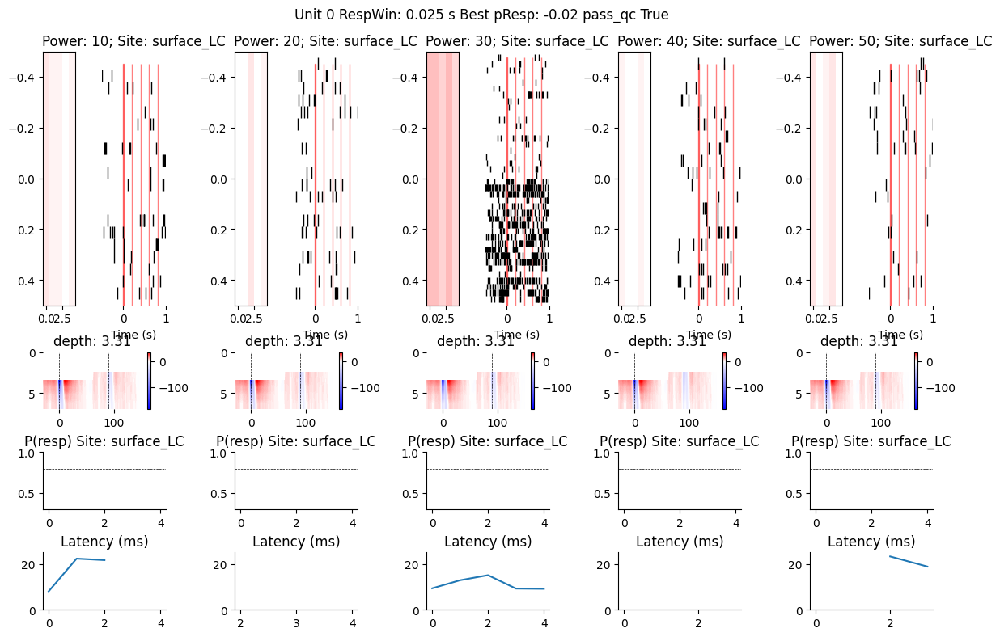

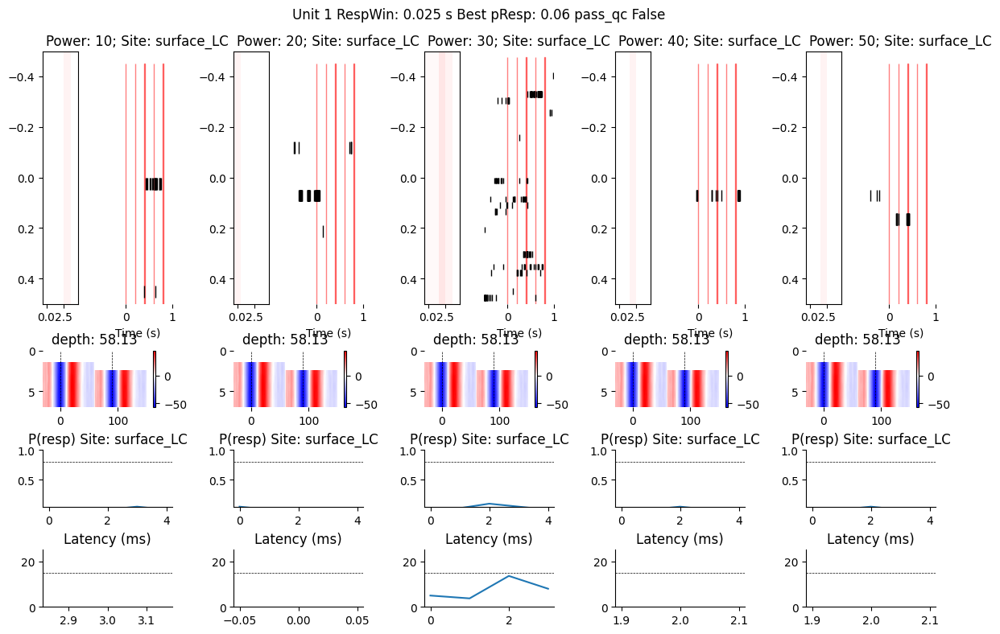

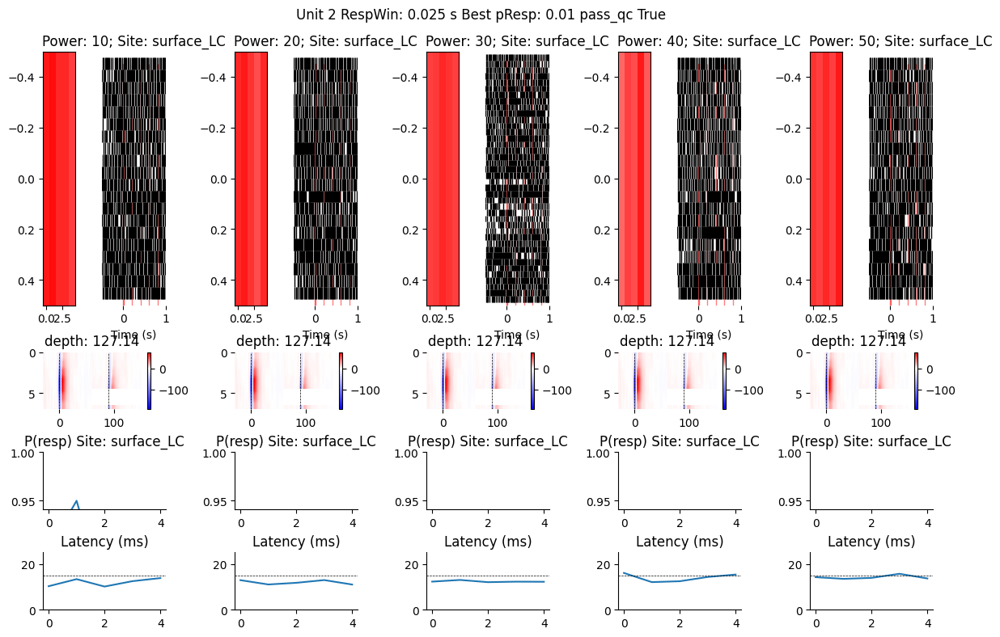

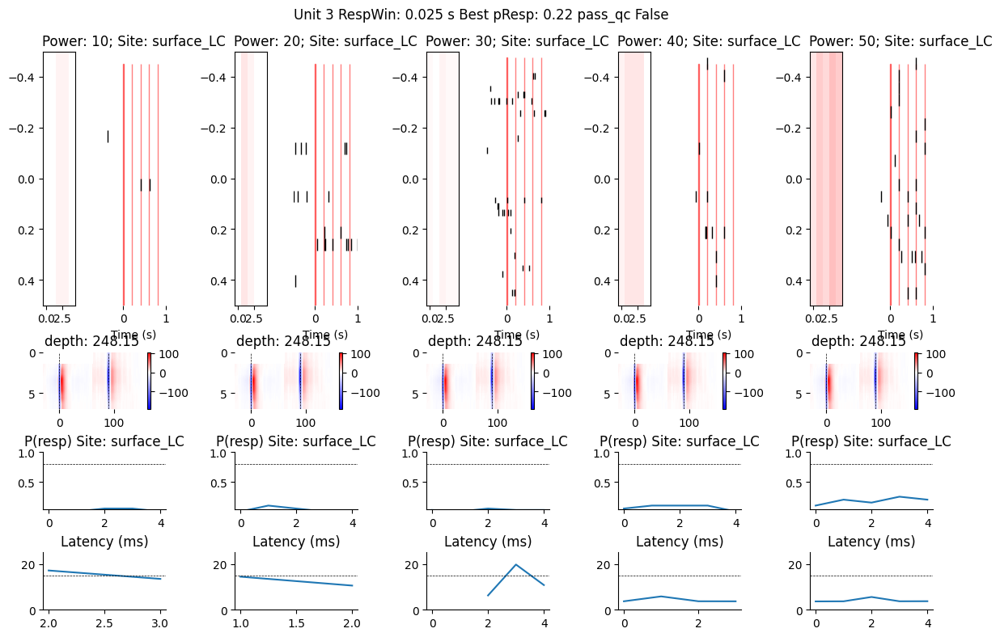

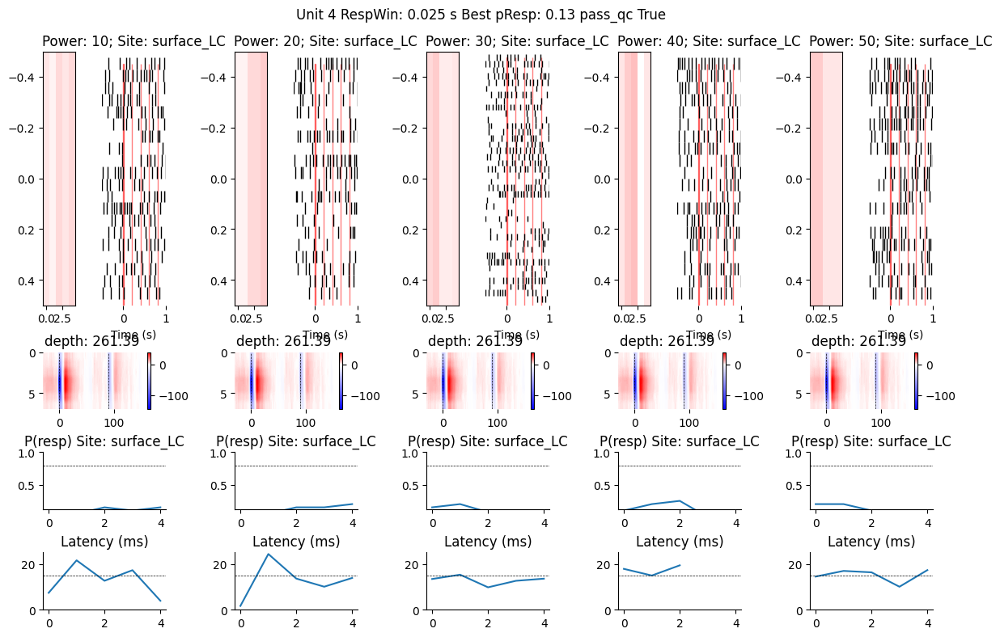

...

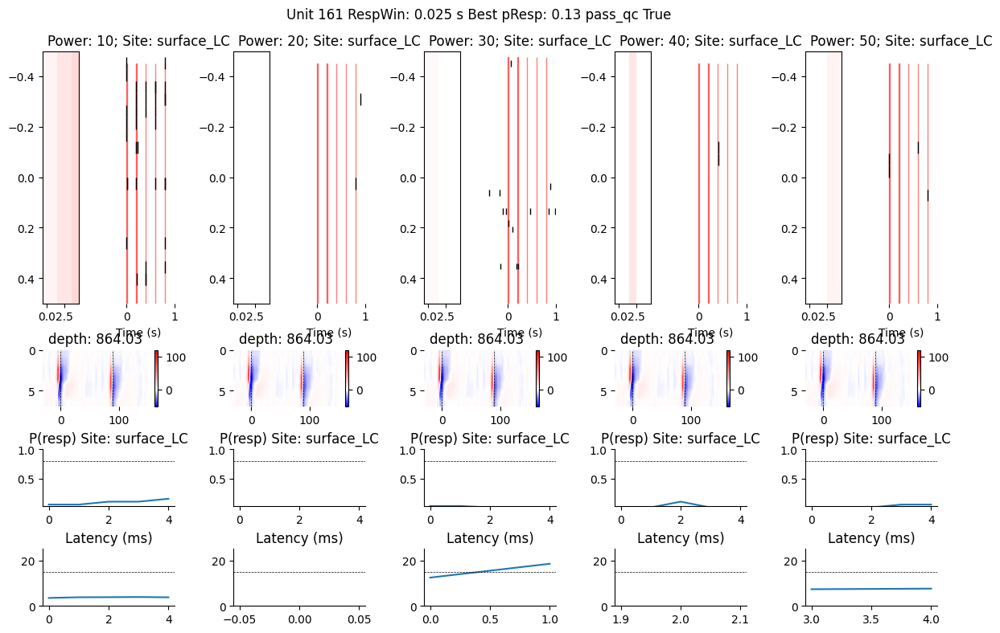

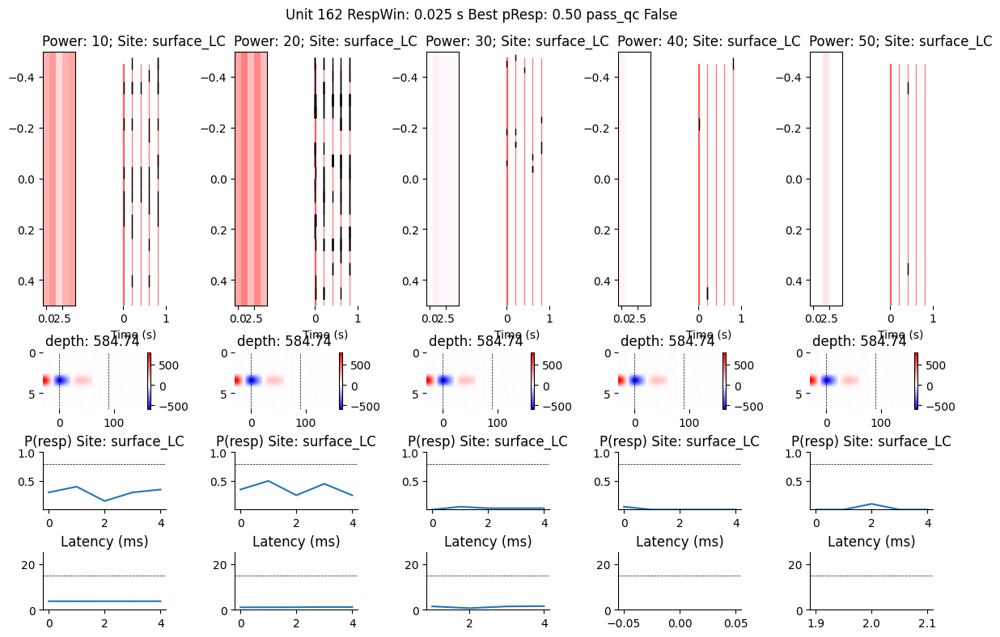

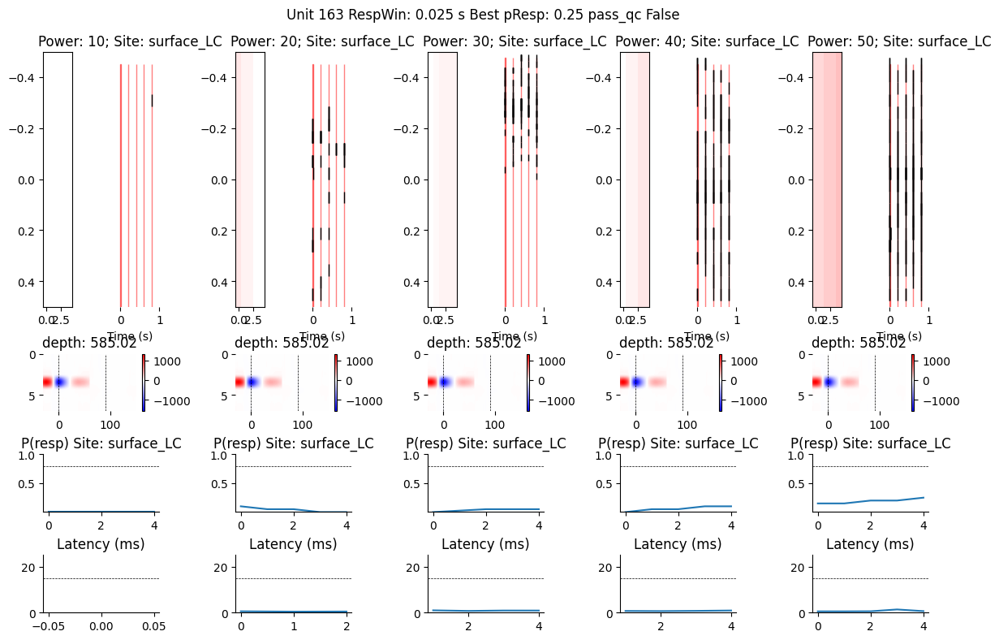

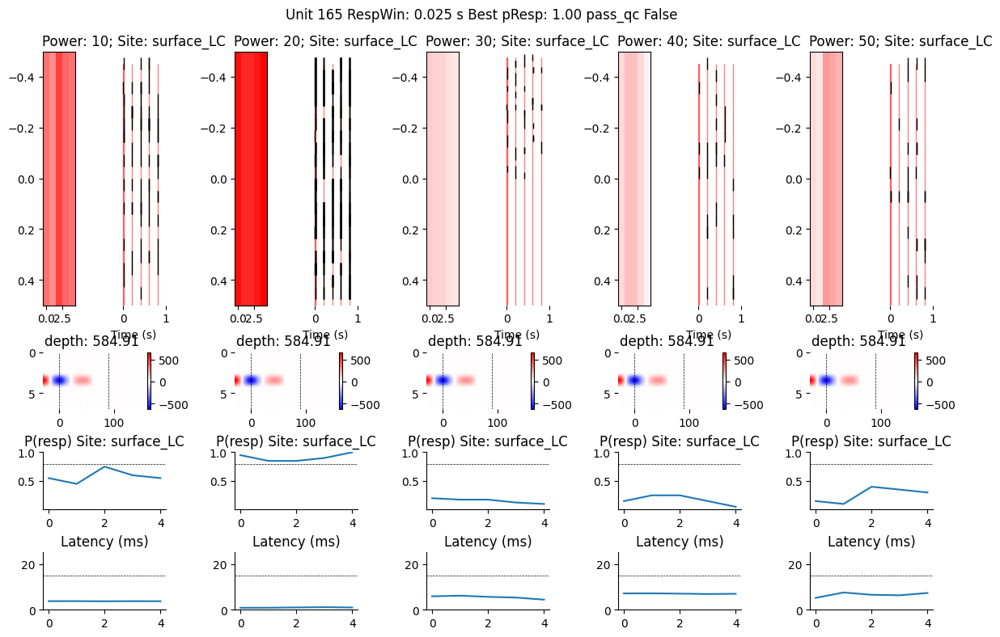

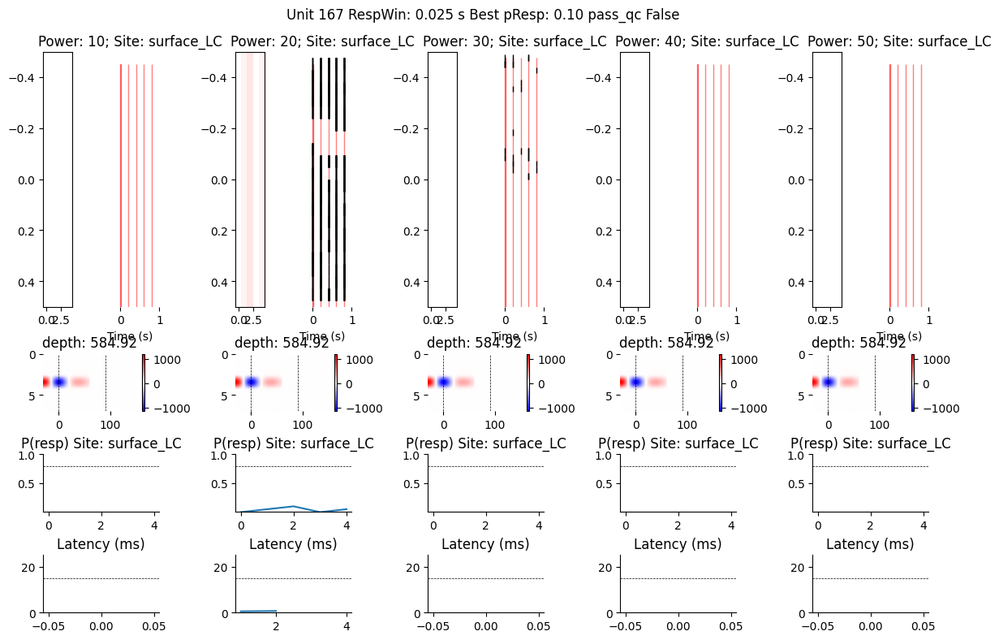

In [75]:
for unit_id in unit_ids:
#     if pass_qc[unit_id]:   
    plot_opto_tagging(session_id, unit_id)

# plot_opto_tagging(session_id, 14) 

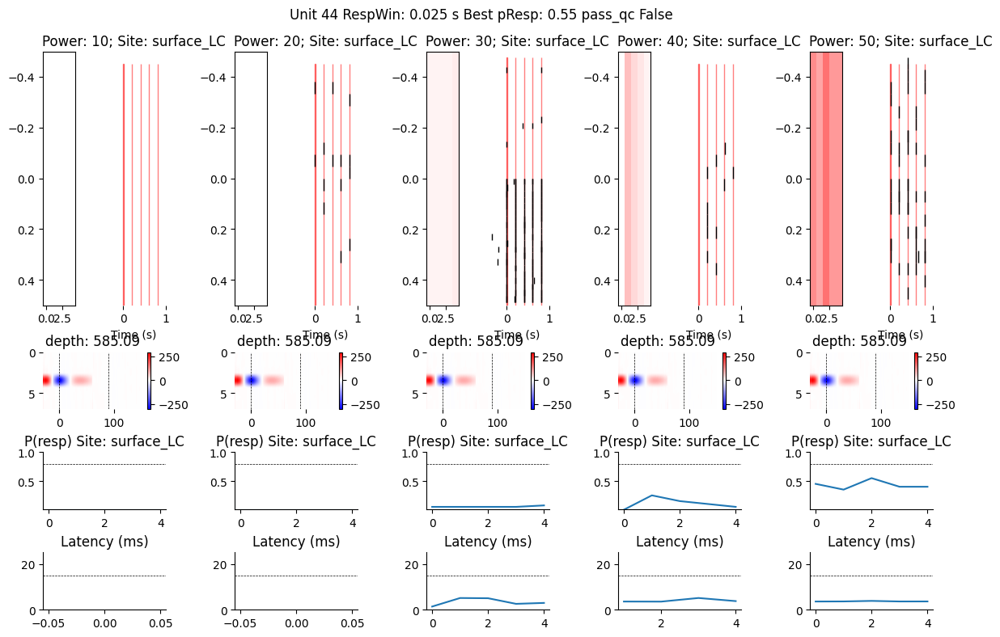

In [76]:
plot_opto_tagging(session_id, 44) 

In [12]:
merge_pdfs(session_dir['opto_tag_fig_dir'], os.path.join(session_dir['opto_tag_dir'], 'opto_tagging.pdf'))

Merging file 0 out of 148
Merging file 50 out of 148
Merging file 100 out of 148
PDF files in '/root/capsule/scratch/751004/behavior_751004_2024-12-22_13-09-17/opto_tag/figures' merged into '/root/capsule/scratch/751004/behavior_751004_2024-12-22_13-09-17/opto_tag/opto_tagging.pdf' successfully.
